<a href="https://colab.research.google.com/github/shraddha09107/EvEnergyConsumptionproject/blob/main/EV_bus_energyPredition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [172]:
import numpy as np
import pandas as pd

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import (
    StandardScaler, MinMaxScaler, RobustScaler,
    OneHotEncoder, LabelEncoder
)
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, confusion_matrix, classification_report,
    mean_squared_error, mean_absolute_error, r2_score
)

import matplotlib.pyplot as plt
import joblib
import seaborn as sns

In [173]:
df=pd.read_csv("/content/EV_Energy_Consumption_Dataset.csv")

In [174]:
df.info

<bound method DataFrame.info of       Vehicle_ID            Timestamp   Speed_kmh  Acceleration_ms2  \
0           1102  2024-01-01 00:00:00  111.507366         -2.773816   
1           1435  2024-01-01 00:01:00   48.612323         -0.796982   
2           1860  2024-01-01 00:02:00  108.733320          0.253800   
3           1270  2024-01-01 00:03:00   38.579484         -2.111395   
4           1106  2024-01-01 00:04:00   57.172438          1.477883   
...          ...                  ...         ...               ...   
4995        1289  2024-01-04 11:15:00   60.036619         -0.685606   
4996        1294  2024-01-04 11:16:00  107.291944          1.674625   
4997        1450  2024-01-04 11:17:00  110.384512          1.348736   
4998        1903  2024-01-04 11:18:00    6.618791         -2.642843   
4999        1214  2024-01-04 11:19:00   98.476987          0.489050   

      Battery_State_%  Battery_Voltage_V  Battery_Temperature_C  Driving_Mode  \
0           30.415148         378.091525              25.314786             2   
1           97.385534         392.718377              18.240755             1   
2           84.912600         398.993495              44.449145             1   
3           28.777904         358.128273              28.980155             1   
4           29.740160         310.888162              33.184551             2   
...               ...                ...                    ...           ...   
4995        78.360306         355.284001              23.338767             2   
4996        68.163963         375.453798              19.056652             2   
4997        72.918142         303.834905              28.155775             1   
4998        91.904887         302.708365              31.781034             2   
4999        82.716863         308.334933              24.703606             1   

      Road_Type  Traffic_Condition   Slope_%  Weather_Condition  \
0             1                  1  6.879446                  4   
1             2                  1 -3.007212                  4   
2             1                  3  0.029585                  1   
3             2                  2  8.271943                  3   
4             1                  1  2.776814                  2   
...         ...                ...       ...                ...   
4995          1                  2  0.273436                  1   
4996          2                  2  9.793821                  3   
4997          3                  2 -0.429536                  1   
4998          1                  2 -3.366394                  3   
4999          1                  1 -2.129397                  4   

      Temperature_C  Humidity_%  Wind_Speed_ms  Tire_Pressure_psi  \
0          0.741770   42.172533       7.829253          31.112020   
1         -3.495516   57.018427       4.495572          31.504366   
2          9.248275   69.028911       5.144489          33.838015   
3          2.868409   86.638349       4.518283          33.256014   
4         16.750244   27.189185       4.263406          33.579678   
...             ...         ...            ...                ...   
4995       2.678321   73.356245      13.936821          28.327849   
4996      37.105374   78.446046      12.197087          29.155964   
4997      -2.955831   78.251840       1.595182          34.369795   
4998      16.154754   74.929797      13.503355          33.363985   
4999      29.660221   41.293694       0.359335          31.152982   

      Vehicle_Weight_kg  Distance_Travelled_km  Energy_Consumption_kWh  
0           1822.967368              20.757508               12.054317  
1           2091.831914               0.642918                4.488701  
2           1816.702497              40.842824               11.701377  
3           1283.102642               5.305229                7.389266  
4           2160.350788               5.825926                6.761205  
...                 ...                    ...                     ...

In [175]:

df

,Vehicle_ID,Timestamp,Speed_kmh,Acceleration_ms2,Battery_State_%,Battery_Voltage_V,Battery_Temperature_C,Driving_Mode,Road_Type,Traffic_Condition,Slope_%,Weather_Condition,Temperature_C,Humidity_%,Wind_Speed_ms,Tire_Pressure_psi,Vehicle_Weight_kg,Distance_Travelled_km,Energy_Consumption_kWh
0,1102,2024-01-01 00:00:00,111.507366,-2.773816,30.415148,378.091525,25.314786,2,1,1,6.879446,4,0.741770,42.172533,7.829253,31.112020,1822.967368,20.757508,12.054317
1,1435,2024-01-01 00:01:00,48.612323,-0.796982,97.385534,392.718377,18.240755,1,2,1,-3.007212,4,-3.495516,57.018427,4.495572,31.504366,2091.831914,0.642918,4.488701
2,1860,2024-01-01 00:02:00,108.733320,0.253800,84.912600,398.993495,44.449145,1,1,3,0.029585,1,9.248275,69.028911,5.144489,33.838015,1816.702497,40.842824,11.701377
3,1270,2024-01-01 00:03:00,38.579484,-2.111395,28.777904,358.128273,28.980155,1,2,2,8.271943,3,2.868409,86.638349,4.518283,33.256014,1283.102642,5.305229,7.389266
4,1106,2024-01-01 00:04:00,57.172438,1.477883,29.740160,310.888162,33.184551,2,1,1,2.776814,2,16.750244,27.189185,4.263406,33.579678,2160.350788,5.825926,6.761205
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,1289,2024-01-04 11:15:00,60.036619,-0.685606,78.360306,355.284001,23.338767,2,1,2,0.273436,1,2.678321,73.356245,13.936821,28.327849,1796.093041,47.102202,10.089577
4996,1294,2024-01-04 11:16:00,107.291944,1.674625,68.163963,375.453798,19.056652,2,2,2,9.793821,3,37.105374,78.446046,12.197087,29.155964,2095.099662,7.538642,9.600692
4997,1450,2024-01-04 11:17:00,110.384512,1.348736,72.918142,303.834905,28.155775,1,3,2,-0.429536,1,-2.955831,78.251840,1.595182,34.369795,2328.330539,5.644158,9.148392
4998,1903,2024-01-04 11:18:00,6.618791,-2.642843,91.904887,302.708365,31.781034,2,1,2,-3.366394,3,16.154754,74.929797,13.503355,33.363985,1274.506744,32.768008,5.581431


In [176]:
df.isnull().sum()

,0
Vehicle_ID,0
Timestamp,0
Speed_kmh,0
Acceleration_ms2,0
Battery_State_%,0
Battery_Voltage_V,0
Battery_Temperature_C,0
Driving_Mode,0
Road_Type,0
Traffic_Condition,0


In [177]:
duplicate_rows = df[df.duplicated()]
duplicate_rows

,Vehicle_ID,Timestamp,Speed_kmh,Acceleration_ms2,Battery_State_%,Battery_Voltage_V,Battery_Temperature_C,Driving_Mode,Road_Type,Traffic_Condition,Slope_%,Weather_Condition,Temperature_C,Humidity_%,Wind_Speed_ms,Tire_Pressure_psi,Vehicle_Weight_kg,Distance_Travelled_km,Energy_Consumption_kWh


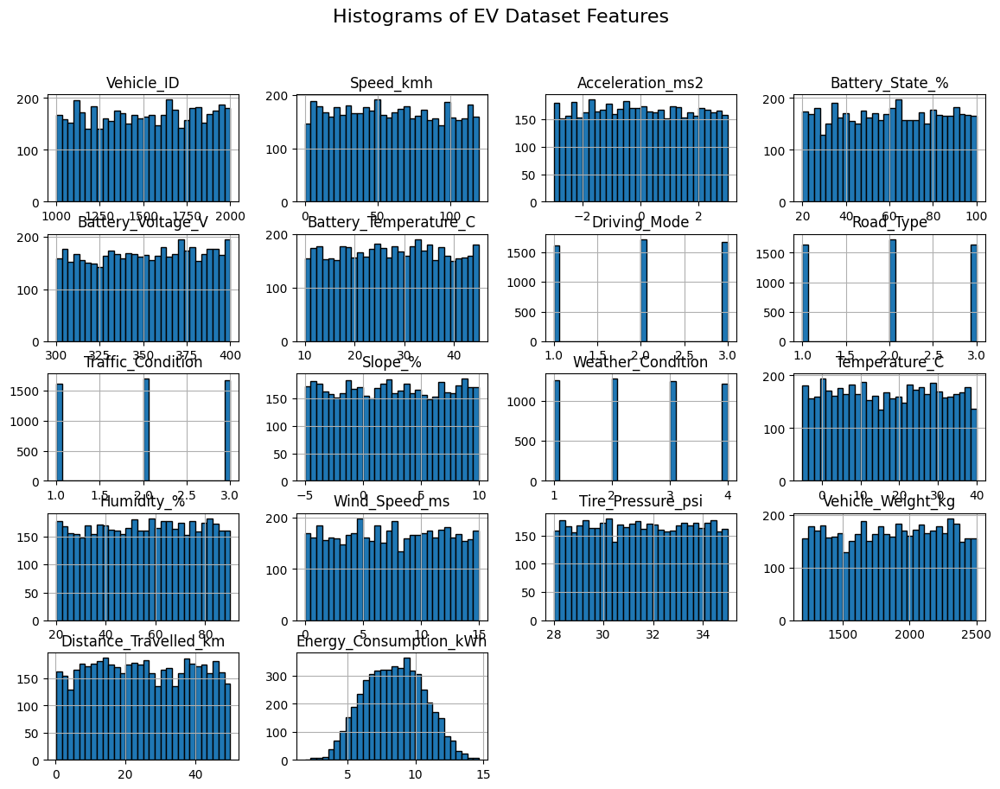

In [178]:
df.hist(figsize=(14, 10), bins=30, edgecolor='black')
plt.suptitle("Histograms of EV Dataset Features", fontsize=16)
plt.show()

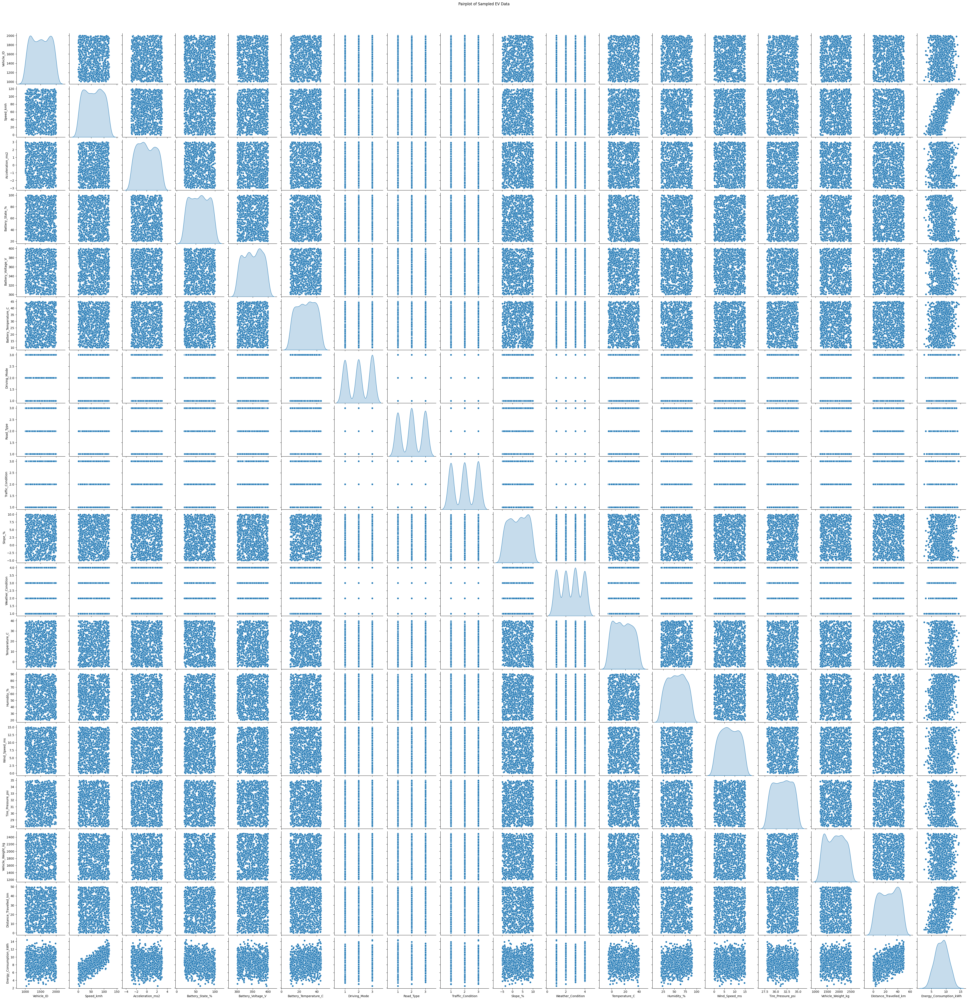

In [179]:

sample_df = df.sample(1000) if len(df) > 1000 else df

sns.pairplot(sample_df, diag_kind="kde")
plt.suptitle("Pairplot of Sampled EV Data", y=1.02)
plt.show()

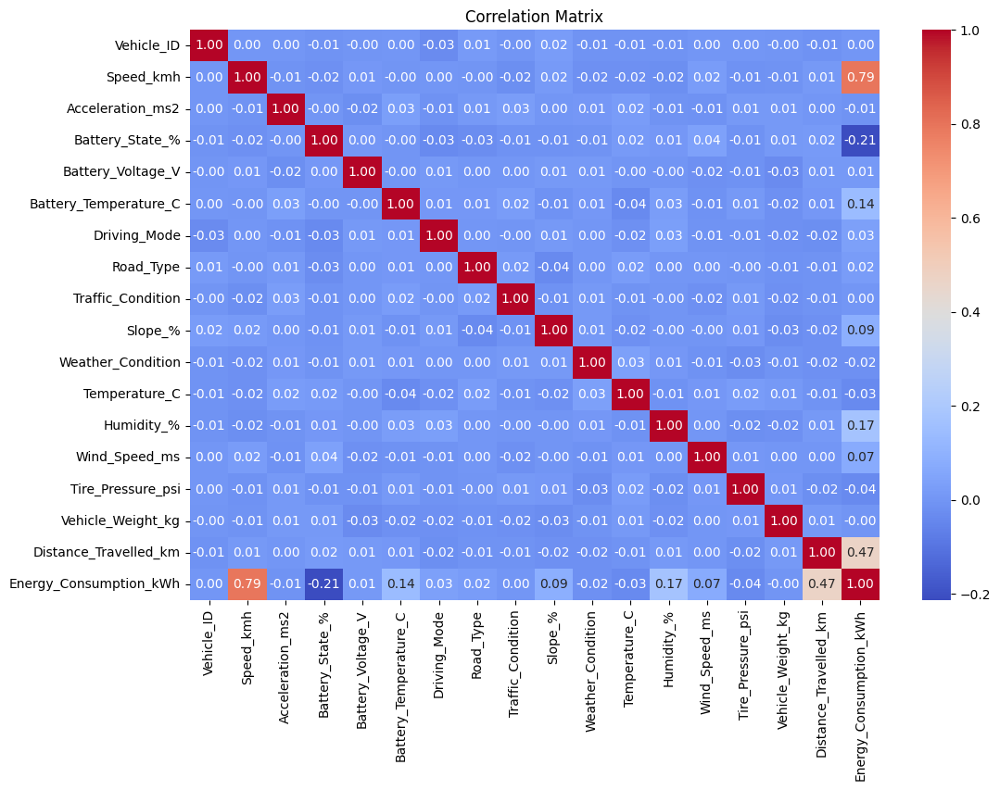

In [182]:
plt.figure(figsize=(12, 8))

numeric_df = df.select_dtypes(include=np.number)
corr = numeric_df.corr()
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm")
plt.title("Correlation Matrix")
plt.show()

In [184]:
average_Speed=df["Speed_kmh"].mean()
average_Speed
average_distance=df["Distance_Travelled_km"]
average_distance

,Distance_Travelled_km
0,20.757508
1,0.642918
2,40.842824
3,5.305229
4,5.825926
...,...
4995,47.102202
4996,7.538642
4997,5.644158
4998,32.768008


In [185]:
max_speed=df["Speed_kmh"].max()
max_speed


119.94692439005264

In [186]:
df['energy_per_km'] = df['Energy_Consumption_kWh'] / df['Distance_Travelled_km']

df['speed_variation'] = abs(df['Acceleration_ms2']) * df['Speed_kmh']

df['slope_factor'] = df['Slope_%'] / 100

df['battery_health_proxy'] = df['Battery_Voltage_V'] * (df['Battery_State_%'] / 100)

In [187]:
df['HVAC_active'] = ((df['Temperature_C'] < 18) | (df['Temperature_C'] > 25)).astype(int)
df

,Vehicle_ID,Timestamp,Speed_kmh,Acceleration_ms2,Battery_State_%,Battery_Voltage_V,Battery_Temperature_C,Driving_Mode,Road_Type,Traffic_Condition,...,Wind_Speed_ms,Tire_Pressure_psi,Vehicle_Weight_kg,Distance_Travelled_km,Energy_Consumption_kWh,energy_per_km,speed_variation,slope_factor,battery_health_proxy,HVAC_active
0,1102,2024-01-01 00:00:00,111.507366,-2.773816,30.415148,378.091525,25.314786,2,1,1,...,7.829253,31.112020,1822.967368,20.757508,12.054317,0.580721,309.300879,0.068794,114.997097,1
1,1435,2024-01-01 00:01:00,48.612323,-0.796982,97.385534,392.718377,18.240755,1,2,1,...,4.495572,31.504366,2091.831914,0.642918,4.488701,6.981767,38.743159,-0.030072,382.450888,1
2,1860,2024-01-01 00:02:00,108.733320,0.253800,84.912600,398.993495,44.449145,1,1,3,...,5.144489,33.838015,1816.702497,40.842824,11.701377,0.286498,27.596501,0.000296,338.795751,1
3,1270,2024-01-01 00:03:00,38.579484,-2.111395,28.777904,358.128273,28.980155,1,2,2,...,4.518283,33.256014,1283.102642,5.305229,7.389266,1.392827,81.456538,0.082719,103.061811,1
4,1106,2024-01-01 00:04:00,57.172438,1.477883,29.740160,310.888162,33.184551,2,1,1,...,4.263406,33.579678,2160.350788,5.825926,6.761205,1.160537,84.494168,0.027768,92.458636,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,1289,2024-01-04 11:15:00,60.036619,-0.685606,78.360306,355.284001,23.338767,2,1,2,...,13.936821,28.327849,1796.093041,47.102202,10.089577,0.214206,41.161468,0.002734,278.401631,1
4996,1294,2024-01-04 11:16:00,107.291944,1.674625,68.163963,375.453798,19.056652,2,2,2,...,12.197087,29.155964,2095.099662,7.538642,9.600692,1.273531,179.673786,0.097938,255.924190,1
4997,1450,2024-01-04 11:17:00,110.384512,1.348736,72.918142,303.834905,28.155775,1,3,2,...,1.595182,34.369795,2328.330539,5.644158,9.148392,1.620860,148.879544,-0.004295,221.550766,1
4998,1903,2024-01-04 11:18:00,6.618791,-2.642843,91.904887,302.708365,31.781034,2,1,2,...,13.503355,33.363985,1274.506744,32.768008,5.581431,0.170332,17.492424,-0.033664,278.203783,1


In [188]:
correlations = df.corr()['Energy_Consumption_kWh'].sort_values(ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(x=correlations.index, y=correlations.values, palette='viridis')
plt.title('Feature Correlation with Energy Consumption')
plt.xlabel('Features')
plt.ylabel('Correlation Coefficient')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

print("Sorted correlation coefficients with Energy_Consumption_kWh:")
print(correlations)

ValueError: could not convert string to float: '2024-01-01 00:00:00'

In [189]:
correlations = df.corr()['Energy_Consumption_kWh'].sort_values(ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(x=correlations.index, y=correlations.values, legend=False)
plt.title('Feature Correlation with Energy Consumption')
plt.xlabel('Features')
plt.ylabel('Correlation Coefficient')

plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

print("Sorted correlation coefficients with Energy_Consumption_kWh:")
print(correlations)

ValueError: could not convert string to float: '2024-01-01 00:00:00'

In [207]:
X = df.drop(['Vehicle_ID','Traffic_Condition','Vehicle_Weight_kg','Acceleration_ms2','Timestamp','Energy_Consumption_kWh'], axis=1)
y = df['Energy_Consumption_kWh']
X

,Speed_kmh,Battery_State_%,Battery_Voltage_V,Battery_Temperature_C,Driving_Mode,Road_Type,Slope_%,Weather_Condition,Temperature_C,Humidity_%,Wind_Speed_ms,Tire_Pressure_psi,Distance_Travelled_km,energy_per_km,speed_variation,slope_factor,battery_health_proxy,HVAC_active
0,111.507366,30.415148,378.091525,25.314786,2,1,6.879446,4,0.741770,42.172533,7.829253,31.112020,20.757508,0.580721,309.300879,0.068794,114.997097,1
1,48.612323,97.385534,392.718377,18.240755,1,2,-3.007212,4,-3.495516,57.018427,4.495572,31.504366,0.642918,6.981767,38.743159,-0.030072,382.450888,1
2,108.733320,84.912600,398.993495,44.449145,1,1,0.029585,1,9.248275,69.028911,5.144489,33.838015,40.842824,0.286498,27.596501,0.000296,338.795751,1
3,38.579484,28.777904,358.128273,28.980155,1,2,8.271943,3,2.868409,86.638349,4.518283,33.256014,5.305229,1.392827,81.456538,0.082719,103.061811,1
4,57.172438,29.740160,310.888162,33.184551,2,1,2.776814,2,16.750244,27.189185,4.263406,33.579678,5.825926,1.160537,84.494168,0.027768,92.458636,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,60.036619,78.360306,355.284001,23.338767,2,1,0.273436,1,2.678321,73.356245,13.936821,28.327849,47.102202,0.214206,41.161468,0.002734,278.401631,1
4996,107.291944,68.163963,375.453798,19.056652,2,2,9.793821,3,37.105374,78.446046,12.197087,29.155964,7.538642,1.273531,179.673786,0.097938,255.924190,1
4997,110.384512,72.918142,303.834905,28.155775,1,3,-0.429536,1,-2.955831,78.251840,1.595182,34.369795,5.644158,1.620860,148.879544,-0.004295,221.550766,1
4998,6.618791,91.904887,302.708365,31.781034,2,1,-3.366394,3,16.154754,74.929797,13.503355,33.363985,32.768008,0.170332,17.492424,-0.033664,278.203783,1


In [208]:
X

,Speed_kmh,Battery_State_%,Battery_Voltage_V,Battery_Temperature_C,Driving_Mode,Road_Type,Slope_%,Weather_Condition,Temperature_C,Humidity_%,Wind_Speed_ms,Tire_Pressure_psi,Distance_Travelled_km,energy_per_km,speed_variation,slope_factor,battery_health_proxy,HVAC_active
0,111.507366,30.415148,378.091525,25.314786,2,1,6.879446,4,0.741770,42.172533,7.829253,31.112020,20.757508,0.580721,309.300879,0.068794,114.997097,1
1,48.612323,97.385534,392.718377,18.240755,1,2,-3.007212,4,-3.495516,57.018427,4.495572,31.504366,0.642918,6.981767,38.743159,-0.030072,382.450888,1
2,108.733320,84.912600,398.993495,44.449145,1,1,0.029585,1,9.248275,69.028911,5.144489,33.838015,40.842824,0.286498,27.596501,0.000296,338.795751,1
3,38.579484,28.777904,358.128273,28.980155,1,2,8.271943,3,2.868409,86.638349,4.518283,33.256014,5.305229,1.392827,81.456538,0.082719,103.061811,1
4,57.172438,29.740160,310.888162,33.184551,2,1,2.776814,2,16.750244,27.189185,4.263406,33.579678,5.825926,1.160537,84.494168,0.027768,92.458636,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,60.036619,78.360306,355.284001,23.338767,2,1,0.273436,1,2.678321,73.356245,13.936821,28.327849,47.102202,0.214206,41.161468,0.002734,278.401631,1
4996,107.291944,68.163963,375.453798,19.056652,2,2,9.793821,3,37.105374,78.446046,12.197087,29.155964,7.538642,1.273531,179.673786,0.097938,255.924190,1
4997,110.384512,72.918142,303.834905,28.155775,1,3,-0.429536,1,-2.955831,78.251840,1.595182,34.369795,5.644158,1.620860,148.879544,-0.004295,221.550766,1
4998,6.618791,91.904887,302.708365,31.781034,2,1,-3.366394,3,16.154754,74.929797,13.503355,33.363985,32.768008,0.170332,17.492424,-0.033664,278.203783,1


In [209]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42)

## Model 1 == Linear Regression

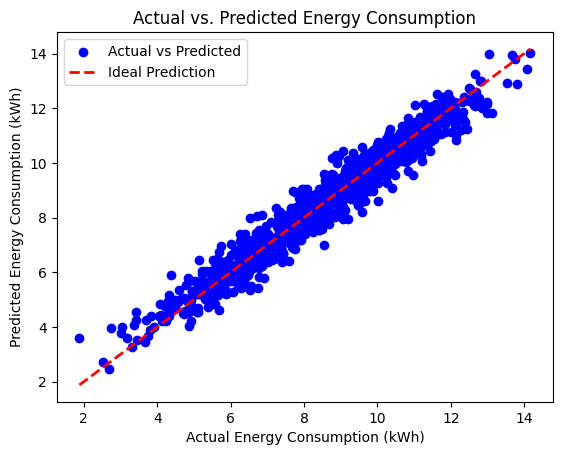

,Energy_Consumption_kWh
1501,0.661015
2586,-0.584034
2653,0.194343
1055,1.556345
705,0.008391
...,...
4711,-0.176815
2313,0.442503
3214,-0.513340
2732,0.463621


In [278]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
model=LinearRegression()
model.fit(X_train,y_train)
predicton=model.predict(X_test)
error=y_test-predicton


plt.scatter(y_test, predicton, color="blue", label="Actual vs Predicted")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()],color='red', linestyle="--", linewidth=2, label="Ideal Prediction")
plt.title("Actual vs. Predicted Energy Consumption")
plt.xlabel("Actual Energy Consumption (kWh)")
plt.ylabel("Predicted Energy Consumption (kWh)")
plt.legend()
plt.show()

error

In [277]:
m=model.coef_
b=model.intercept_
print(f"Slope (m): {m}")
print(f"Intercept (b): {b}")

Slope (m): [ 0.04784935 -0.01258837  0.00139838  0.02918188  0.08204848  0.07083466
  0.04104305 -0.00742372 -0.00068108  0.01962075  0.0324972  -0.02347776
  0.07051904  0.00425132  0.00120119  0.00041043 -0.00203681 -0.00653709]
Intercept (b): 2.6566395694054563


/tmp/ipython-input-3429209546.py:8: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


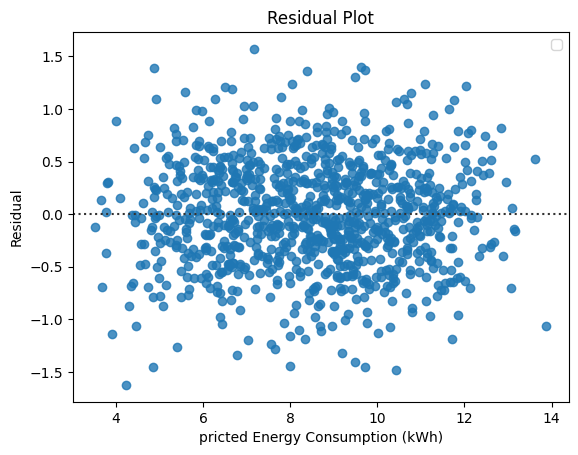

In [267]:
sns.residplot(x = prediction,
              y = error,
              data = X)

plt.title("Residual Plot")
plt.xlabel("pricted Energy Consumption (kWh)")
plt.ylabel("Residual")
plt.legend()
plt.show()

In [268]:
mse = mean_squared_error(y_test, predicton)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, predicton)
r2 = r2_score(y_test, predicton)


print(f"MSE: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"MAE: {mae:.2f}")
print(f"R² Score: {r2:.4f}")

MSE: 0.26
RMSE: 0.51
MAE: 0.40
R² Score: 0.9470


In [250]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_pridict.flatten(), y=rmse.flatten())
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Predicted Values")
plt.ylabel("Residuals (Errors)")
plt.title("Residuals vs. Predicted Values")
plt.grid(True)
plt.show()

ValueError: All arrays must be of the same length

<Figure size 800x600 with 0 Axes>

Modle 2 == Random Forest

In [264]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import accuracy_score, classification_report
import os
import joblib
reg = RandomForestRegressor(n_estimators=10, random_state=0, oob_score=True)

reg.fit(X_train,y_train)
prediction=reg.predict(X_test)




/usr/local/lib/python3.12/dist-packages/sklearn/ensemble/_forest.py:612: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.
  warn(


In [275]:

resi=y_test-prediction

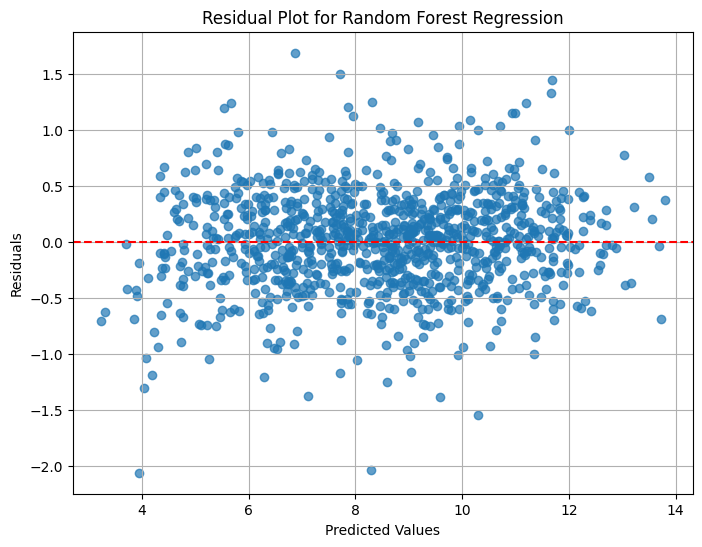

In [276]:

plt.figure(figsize=(8, 6))
plt.scatter(prediction, resi, alpha=0.7)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Residual Plot for Random Forest Regression")
plt.grid(True)
plt.show()

In [269]:
mse = mean_squared_error(y, predictions)
r2 = r2_score(y, predictions)
mae = mean_absolute_error(y_test, prediction)
rmse = np.sqrt(mse)
print(f'mse: {mse}')
print(f'r2: {r2}')
print(f'mae: {mae}')
print(f'mse: {rmse}')




mse: 0.0987177465593254
r2: 0.9793150270835783
mae: 0.383786695594764
mse: 0.3141938041389827


Model 3 == XGboost

In [239]:
import xgboost as xgb

model1 = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, max_depth=5)
model1.fit(X_train,y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.1, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=5,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=100,
             n_jobs=None, num_parallel_tree=None, ...)

In [270]:
prediction = model1.predict(X_test)
mse = mean_squared_error(y, predictions)
rmse = np.sqrt(mean_squared_error(y_test, prediction))
mae=mean_absolute_error(y_test, prediction)
r2=r2_score(y_test, prediction)
print(f'mse: {mse}')
print(f"rmse: {rmse}")
print(f"mae: {mae}")
print(f"r2: {r2}")



mse: 0.0987177465593254
rmse: 0.4419741740893542
mae: 0.3376787881066424
r2: 0.9597172821445018


out of three models we have used linearregression as it showed better r2 score than rest of the models.

In [242]:
os.makedirs("model", exist_ok=True)
joblib.dump(model, "model/model.pkl")

print("Model saved at → models/model.pkl")

Model saved at → models/model.pkl
